In [2]:
%load_ext autoreload
%autoreload 2


In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import sys
YOLACT_PATH = "/root/3D-Instance-Segmentation-with-LDLS-YOLACT/yolact"
LDLS_PATH = "/root/3D-Instance-Segmentation-with-LDLS-YOLACT/ldls"
sys.path.append(YOLACT_PATH)
sys.path.append(LDLS_PATH)
from collections import deque
from data import COCODetection, get_label_map, MEANS, COLORS

import skimage
from pathlib import Path
from lidar_segmentation.detections import YolactDetections
from lidar_segmentation.segmentation import LidarSegmentation
from lidar_segmentation.kitti_utils import load_kitti_lidar_data, load_kitti_object_calib,KittiProjection
from lidar_segmentation.utils import load_image
from lidar_segmentation.plotting import plot_segmentation_result,plot_points

import numpy as np
import pickle

from time import sleep


import cv2
import copy

from yolact import Yolact
from skimage.io import imread
from layers.output_utils import postprocess, undo_image_transformation
from data.config import set_cfg,cfg
from utils.augmentations import FastBaseTransform
import torch
import torch.backends.cudnn as cudnn
from collections import defaultdict



In [2]:
!ls

'3D Instance Segmentation with LDLS-YOLACT.ipynb'   data
 Dockerfile					    ldls
 README.md					    requirements.txt
 cuda-repo-ubuntu1804_10.1.105-1_amd64.deb	    yolact


# Yolact Settings


In [16]:
transform = FastBaseTransform()
cudnn.fastest = True
torch.set_default_tensor_type('torch.cuda.FloatTensor')
config = "yolact_darknet53_config"
set_cfg(config)
cfg.mask_proto_debug = False
net = Yolact()

model_name = "/weights/yolact_darknet53_54_800000.pth"
net.load_weights(model_name)
net.eval()
net = net.cuda() #load the net to gpu
net.detect.use_fast_nms = True
net.detect.use_cross_class_nms = False



print("Model loaded")

Model loaded


In [17]:
ext = np.array([[0.000528046,  -0.999968,  0.00801468,  0.0390392],
                [-0.0381385,-0.00802898,-0.99924,-0.0438104],
                [0.999272,0.000221977,-0.0381415,-0.063029]])
intr = np.array([[591.13,0,320.019],        
                 [0,578.745,260.225],
                 [0,0,1]])
#Camera intrinsic and extrinsic matrices for projecting points into the image
projection = KittiProjection.load_livox(intr,ext)
lidarseg  = LidarSegmentation(projection)

## Load Image and Lidar Data

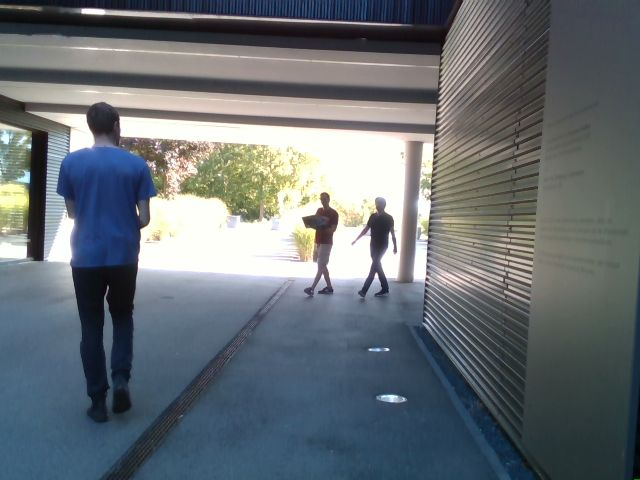

In [18]:
import open3d as o3d
input_num = 1400
scene = 1
from PIL import Image


im3 = Image.open("./data/image_{}.png".format(format(input_num,"03d")))
im3

## Loading the point cloud and visualizing it

In [19]:
def get_in_view(lidar, projected, img_rows, img_cols):
        in_frame_x = np.logical_and(projected[:, 0] > 0,
                                    projected[:, 0] < img_cols - 1)
        in_frame_y = np.logical_and(projected[:, 1] > 0,
                                    projected[:, 1] < img_rows - 1)

        projected_in_frame = np.logical_and(in_frame_x, in_frame_y)
        # Lidar point is in view if in front of camera (x>0) *and* projects
        # to inside the image
        in_view = np.logical_and(lidar[:, 0] > 0, projected_in_frame)
        # Check which lidar points project to within the image bounds
        return in_view

pcd = o3d.io.read_point_cloud("data/lidar_{}.pcd".format(format(input_num,"03d")))

np_points = np.asarray(pcd.points)
plot_points(np_points)


## Projecting 3D points into image

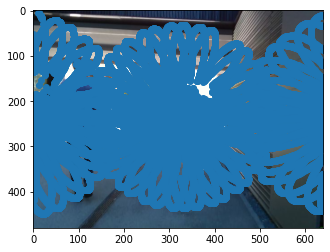

In [20]:

z_limit = 10000 #  for cropping the z axis if needed
ones = np.ones(len(np_points))
ones = ones.reshape([ones.shape[0],1])

homo_points = np.concatenate([np_points,ones],axis=1)

cam_points = np.matmul(ext,homo_points.T).T
inds = cam_points[:,2] < z_limit
np_points= np_points[inds]

unnormalized = np.matmul(intr,cam_points[inds].T)[:3,:]
im_points = (unnormalized[:2,:]/unnormalized[2,:])
plt.imshow(im3)
in_image = get_in_view(np_points,im_points.T,np.array(im3).shape[0],np.array(im3).shape[1])
np_points = np_points[in_image]
im_points = im_points.T[in_image].T
plt.scatter(im_points[0,:],im_points[1,:])

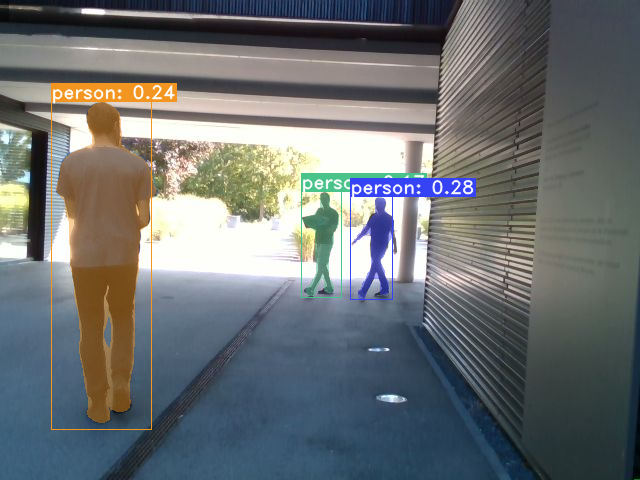

In [22]:
class dict_with_attributes(object):
    def __init__(self, d):
        self.__dict__ = d

def predict(image):
    im = torch.Tensor(np.array(image))
    h,w,_=  im.shape
    batch = transform(im.unsqueeze(0))
    return net(batch)
        
        
args = {"display_lincomb":False,
       "crop":True,
       "score_threshold":0.17,
       "top_k":10,
       "display_text":True,
       "display_bboxes":True,
       "display_masks":True,
       "display_fps":True,
       "display_scores":True}
args = dict_with_attributes(args)
color_cache = defaultdict(lambda: {})

def prep_display(dets_out, img, h, w, undo_transform=True, class_color=False, mask_alpha=0.45, fps_str=''):
    """
    Note: If undo_transform=False then im_h and im_w are allowed to be None.
    """
    if undo_transform:
        img_numpy = undo_image_transformation(img, w, h)
        img_gpu = torch.Tensor(img_numpy).cuda()
    else:
        img_gpu = img / 255.0
        h, w, _ = img.shape
    
    
    save = cfg.rescore_bbox
    cfg.rescore_bbox = True
    t = postprocess(dets_out, w, h, visualize_lincomb = args.display_lincomb,
                                    crop_masks        = args.crop,
                                    score_threshold   = args.score_threshold)
    cfg.rescore_bbox = save

    idx = t[1].argsort(0, descending=True)[:args.top_k]
    if cfg.eval_mask_branch:
        # Masks are drawn on the GPU, so don't copy
        masks = t[3][idx]
    classes, scores, boxes = [x[idx].cpu().numpy() for x in t[:3]]

    num_dets_to_consider = min(args.top_k, classes.shape[0])
    for j in range(num_dets_to_consider):
        if scores[j] < args.score_threshold:
            num_dets_to_consider = j
            break

    # Quick and dirty lambda for selecting the color for a particular index
    # Also keeps track of a per-gpu color cache for maximum speed
    def get_color(j, on_gpu=None):
        global color_cache
        color_idx = (classes[j] * 5 if class_color else j * 5) % len(COLORS)
        
        if on_gpu is not None and color_idx in color_cache[on_gpu]:
            return color_cache[on_gpu][color_idx]
        else:
            color = COLORS[color_idx]
            if not undo_transform:
                # The image might come in as RGB or BRG, depending
                color = (color[2], color[1], color[0])
            if on_gpu is not None:
                color = torch.Tensor(color).to(on_gpu).float() / 255.
                color_cache[on_gpu][color_idx] = color
            return color

    # First, draw the masks on the GPU where we can do it really fast
    # Beware: very fast but possibly unintelligible mask-drawing code ahead
    # I wish I had access to OpenGL or Vulkan but alas, I guess Pytorch tensor operations will have to suffice
    if args.display_masks and cfg.eval_mask_branch and num_dets_to_consider > 0:
        # After this, mask is of size [num_dets, h, w, 1]
        masks = masks[:num_dets_to_consider, :, :, None]
        
        # Prepare the RGB images for each mask given their color (size [num_dets, h, w, 1])
        colors = torch.cat([get_color(j, on_gpu=img_gpu.device.index).view(1, 1, 1, 3) for j in range(num_dets_to_consider)], dim=0)
        masks_color = masks.repeat(1, 1, 1, 3) * colors * mask_alpha

        # This is 1 everywhere except for 1-mask_alpha where the mask is
        inv_alph_masks = masks * (-mask_alpha) + 1
        
        # I did the math for this on pen and paper. This whole block should be equivalent to:
        #    for j in range(num_dets_to_consider):
        #        img_gpu = img_gpu * inv_alph_masks[j] + masks_color[j]
        masks_color_summand = masks_color[0]
        if num_dets_to_consider > 1:
            inv_alph_cumul = inv_alph_masks[:(num_dets_to_consider-1)].cumprod(dim=0)
            masks_color_cumul = masks_color[1:] * inv_alph_cumul
            masks_color_summand += masks_color_cumul.sum(dim=0)

        img_gpu = img_gpu * inv_alph_masks.prod(dim=0) + masks_color_summand
    
    if args.display_fps:
            # Draw the box for the fps on the GPU
        font_face = cv2.FONT_HERSHEY_DUPLEX
        font_scale = 0.6
        font_thickness = 1

        text_w, text_h = cv2.getTextSize(fps_str, font_face, font_scale, font_thickness)[0]

        img_gpu[0:text_h+8, 0:text_w+8] *= 0.6 # 1 - Box alpha


    # Then draw the stuff that needs to be done on the cpu
    # Note, make sure this is a uint8 tensor or opencv will not anti alias text for whatever reason
    img_numpy = (img_gpu * 255).byte().cpu().numpy()

    if args.display_fps:
        # Draw the text on the CPU
        text_pt = (4, text_h + 2)
        text_color = [255, 255, 255]

        cv2.putText(img_numpy, fps_str, text_pt, font_face, font_scale, text_color, font_thickness, cv2.LINE_AA)
    
    if num_dets_to_consider == 0:
        return img_numpy

    if args.display_text or args.display_bboxes:
        for j in reversed(range(num_dets_to_consider)):
            x1, y1, x2, y2 = boxes[j, :]
            color = get_color(j)
            score = scores[j]

            if args.display_bboxes:
                cv2.rectangle(img_numpy, (x1, y1), (x2, y2), color, 1)

            if args.display_text:
                _class = cfg.dataset.class_names[classes[j]]
                text_str = '%s: %.2f' % (_class, score) if args.display_scores else _class

                font_face = cv2.FONT_HERSHEY_DUPLEX
                font_scale = 0.6
                font_thickness = 1

                text_w, text_h = cv2.getTextSize(text_str, font_face, font_scale, font_thickness)[0]

                text_pt = (x1, y1 - 3)
                text_color = [255, 255, 255]

                cv2.rectangle(img_numpy, (x1, y1), (x1 + text_w, y1 - text_h - 4), color, -1)
                cv2.putText(img_numpy, text_str, text_pt, font_face, font_scale, text_color, font_thickness, cv2.LINE_AA)
            
    
    return {"img_numpy" : img_numpy,
            "classes":classes,
            "masks":masks,
            "boxes":boxes,
           "scores":scores}


def prep_result(preds):
    with torch.no_grad():
        res = prep_display(preds, torch.Tensor(np.array(im3)), None, None, undo_transform=False)
        img_numpy = res["img_numpy"]
        return res,Image.fromarray(img_numpy)

import time
with torch.no_grad():
    preds = predict(im3)
    res,seg = prep_result(preds)
    img_numpy,classes,masks,boxes,scores = res.items()

seg

In [24]:
start_time = time.time()
with torch.no_grad():
    random_inds = np.arange(len(np_points))
    np.random.shuffle(random_inds)
    sampled_points = np_points[random_inds][:len(np_points)] #randomly sampling points and getting a subset for performance
    detections = YolactDetections(shape=img_numpy[1].shape,rois=boxes[1],masks=np.moveaxis(masks[1].detach().cpu().numpy(),0,2),class_ids=classes[1]+1,scores=scores[1]
)
    
    results = lidarseg.run(sampled_points, detections, max_iters=100, save_all=False)
    print("Runtime ",1 /(time.time() - start_time), "FPS")
plot_segmentation_result(results,label_type="instance")

Runtime  3.4738802848806056 FPS


Executing: /tmp/apt-key-gpghome.Q2jr6fNJLm/gpg.1.sh --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub
gpg: requesting key from 'https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub'
gpg: key F60F4B3D7FA2AF80: "cudatools <cudatools@nvidia.com>" not changed
gpg: Total number processed: 1
gpg:              unchanged: 1


In [ ]:
!

Hit:1 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease                        
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]    
Hit:4 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease    
Get:5 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]      
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]    
Ign:7 http://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:8 http://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Fetched 252 kB in 1s (178 kB/s)                                
Reading package lists... Done
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  adwaita-icon-theme at-spi2-core ca-certificates-java cuda-11-0
  cuda-command-line-tools-11-0 cuda-compil

Get:1 http://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  cuda-cudart-11-0 11.0.221-1 [130 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libsystemd0 amd64 237-3ubuntu10.42 [208 kB]
Get:3 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-common-450 all 450.66-0ubuntu0.18.04.1 [8716 B]
Get:4 http://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  cuda-nvrtc-11-0 11.0.221-1 [6516 kB]
Get:5 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-compute-450 amd64 450.66-0ubuntu0.18.04.1 [21.8 MB]
Get:6 http://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  libcublas-11-0 11.2.0.252-1 [122 MB]
Get:7 http://archive.ubuntu.com/ubuntu bionic/main amd64 liblocale-gettext-perl amd64 1.07-3build2 [16.6 kB]
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 keyboard-configuration all 1.178ubuntu2.9 [369 kB]
Get:9 http://archive.ubuntu.com/ubuntu

Get:85 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libnss3 amd64 2:3.35-2ubuntu2.12 [1220 kB]
Get:86 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libasound2-data all 1.1.3-5ubuntu0.5 [38.7 kB]
Get:87 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libasound2 amd64 1.1.3-5ubuntu0.5 [360 kB]
Get:88 http://archive.ubuntu.com/ubuntu bionic/main amd64 libpcsclite1 amd64 1.8.23-1 [21.3 kB]
Get:89 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxi6 amd64 2:1.7.9-1 [29.2 kB]
Get:90 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 openjdk-11-jre-headless amd64 11.0.8+10-0ubuntu1~18.04.1 [37.6 MB]
Get:91 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-encode-450 amd64 450.66-0ubuntu0.18.04.1 [38.1 kB]
Get:92 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-fbc1-450 amd64 450.66-0ubuntu0.18.04.1 [49.1 kB]
Get:93 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main a

Get:161 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libwayland-cursor0 amd64 1.16.0-1ubuntu1.1~18.04.3 [10.1 kB]
Get:162 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libwayland-egl1 amd64 1.16.0-1ubuntu1.1~18.04.3 [5464 B]
Get:163 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxcomposite1 amd64 1:0.4.4-2 [6988 B]
Get:164 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxcursor1 amd64 1:1.1.15-1 [19.8 kB]
Get:165 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-ifr1-450 amd64 450.66-0ubuntu0.18.04.1 [67.1 kB]
Get:166 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libxkbcommon0 amd64 0.8.2-1~ubuntu18.04.1 [97.8 kB]
Get:167 http://archive.ubuntu.com/ubuntu bionic/main amd64 libxrandr2 amd64 2:1.5.1-1 [18.1 kB]
Get:168 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libgtk-3-0 amd64 3.22.30-1ubuntu4 [2503 kB]
Get:169 http://archive.ubuntu.com/ubuntu bionic/main amd64 policykit-1-gnome amd64 0.10

Get:240 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 nvidia-dkms-450 amd64 450.66-0ubuntu0.18.04.1 [27.9 kB]
Get:241 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-extra-450 amd64 450.66-0ubuntu0.18.04.1 [38.2 kB]
Get:242 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 nvidia-utils-450 amd64 450.66-0ubuntu0.18.04.1 [366 kB]
Get:243 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libnvidia-cfg1-450 amd64 450.66-0ubuntu0.18.04.1 [73.7 kB]
Get:244 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 xserver-xorg-video-nvidia-450 amd64 450.66-0ubuntu0.18.04.1 [1531 kB]
Get:245 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 nvidia-driver-450 amd64 450.66-0ubuntu0.18.04.1 [429 kB]
Get:246 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 libvdpau1 amd64 1.3-0ubuntu0~gpu18.04.2 [29.3 kB]
Get:247 http://ppa.launchpad.net/graphi

Unpacking keyboard-configuration (1.178ubuntu2.9) ...
Selecting previously unselected package libcap2:amd64.
Preparing to unpack .../libcap2_1%3a2.25-1.2_amd64.deb ...
Unpacking libcap2:amd64 (1:2.25-1.2) ...
Selecting previously unselected package libargon2-0:amd64.
Preparing to unpack .../libargon2-0_0~20161029-1.1_amd64.deb ...
Unpacking libargon2-0:amd64 (0~20161029-1.1) ...
Preparing to unpack .../libudev1_237-3ubuntu10.42_amd64.deb ...
Unpacking libudev1:amd64 (237-3ubuntu10.42) over (237-3ubuntu10.31) ...
Setting up libudev1:amd64 (237-3ubuntu10.42) ...
Selecting previously unselected package libdevmapper1.02.1:amd64.
(Reading database ... 21145 files and directories currently installed.)
Preparing to unpack .../0-libdevmapper1.02.1_2%3a1.02.145-4.1ubuntu3.18.04.3_amd64.deb ...
Unpacking libdevmapper1.02.1:amd64 (2:1.02.145-4.1ubuntu3.18.04.3) ...
Selecting previously unselected package libjson-c3:amd64.
Preparing to unpack .../1-libjson-c3_0.12.1-1.3ubuntu0.3_amd64.deb ...
Unpa

Selecting previously unselected package libxmuu1:amd64.
Preparing to unpack .../028-libxmuu1_2%3a1.1.2-2_amd64.deb ...
Unpacking libxmuu1:amd64 (2:1.1.2-2) ...
Selecting previously unselected package xauth.
Preparing to unpack .../029-xauth_1%3a1.0.10-1_amd64.deb ...
Unpacking xauth (1:1.0.10-1) ...
Selecting previously unselected package hicolor-icon-theme.
Preparing to unpack .../030-hicolor-icon-theme_0.17-2_all.deb ...
Unpacking hicolor-icon-theme (0.17-2) ...
Selecting previously unselected package libjpeg8:amd64.
Preparing to unpack .../031-libjpeg8_8c-2ubuntu8_amd64.deb ...
Unpacking libjpeg8:amd64 (8c-2ubuntu8) ...
Selecting previously unselected package libjbig0:amd64.
Preparing to unpack .../032-libjbig0_2.1-3.1build1_amd64.deb ...
Unpacking libjbig0:amd64 (2.1-3.1build1) ...
Selecting previously unselected package libtiff5:amd64.
Preparing to unpack .../033-libtiff5_4.0.9-5ubuntu0.3_amd64.deb ...
Unpacking libtiff5:amd64 (4.0.9-5ubuntu0.3) ...
Selecting previously unselected

Selecting previously unselected package cuda-cudart-11-0.
Preparing to unpack .../073-cuda-cudart-11-0_11.0.221-1_amd64.deb ...
Unpacking cuda-cudart-11-0 (11.0.221-1) ...
Selecting previously unselected package cuda-nvrtc-11-0.
Preparing to unpack .../074-cuda-nvrtc-11-0_11.0.221-1_amd64.deb ...
Unpacking cuda-nvrtc-11-0 (11.0.221-1) ...
Selecting previously unselected package libcublas-11-0.
Preparing to unpack .../075-libcublas-11-0_11.2.0.252-1_amd64.deb ...
Unpacking libcublas-11-0 (11.2.0.252-1) ...
Selecting previously unselected package libcufft-11-0.
Preparing to unpack .../076-libcufft-11-0_10.2.1.245-1_amd64.deb ...
Unpacking libcufft-11-0 (10.2.1.245-1) ...
Selecting previously unselected package libcurand-11-0.
Preparing to unpack .../077-libcurand-11-0_10.2.1.245-1_amd64.deb ...
Unpacking libcurand-11-0 (10.2.1.245-1) ...
Selecting previously unselected package libcusolver-11-0.
Preparing to unpack .../078-libcusolver-11-0_10.6.0.245-1_amd64.deb ...
Unpacking libcusolver-

Selecting previously unselected package nvidia-kernel-common-450.
Preparing to unpack .../115-nvidia-kernel-common-450_450.66-0ubuntu0.18.04.1_amd64.deb ...
Unpacking nvidia-kernel-common-450 (450.66-0ubuntu0.18.04.1) ...
Selecting previously unselected package nvidia-dkms-450.
Preparing to unpack .../116-nvidia-dkms-450_450.66-0ubuntu0.18.04.1_amd64.deb ...
Unpacking nvidia-dkms-450 (450.66-0ubuntu0.18.04.1) ...
Selecting previously unselected package libnvidia-extra-450:amd64.
Preparing to unpack .../117-libnvidia-extra-450_450.66-0ubuntu0.18.04.1_amd64.deb ...
Unpacking libnvidia-extra-450:amd64 (450.66-0ubuntu0.18.04.1) ...
Selecting previously unselected package nvidia-utils-450.
Preparing to unpack .../118-nvidia-utils-450_450.66-0ubuntu0.18.04.1_amd64.deb ...
Unpacking nvidia-utils-450 (450.66-0ubuntu0.18.04.1) ...
dpkg: error processing archive /tmp/apt-dpkg-install-uVpw6Q/118-nvidia-utils-450_450.66-0ubuntu0.18.04.1_amd64.deb (--unpack):
 unable to make backup link of './usr/b

Selecting previously unselected package libproxy1v5:amd64.
Preparing to unpack .../157-libproxy1v5_0.4.15-1_amd64.deb ...
Unpacking libproxy1v5:amd64 (0.4.15-1) ...
Selecting previously unselected package glib-networking-common.
Preparing to unpack .../158-glib-networking-common_2.56.0-1ubuntu0.1_all.deb ...
Unpacking glib-networking-common (2.56.0-1ubuntu0.1) ...
Selecting previously unselected package glib-networking-services.
Preparing to unpack .../159-glib-networking-services_2.56.0-1ubuntu0.1_amd64.deb ...
Unpacking glib-networking-services (2.56.0-1ubuntu0.1) ...
Selecting previously unselected package gsettings-desktop-schemas.
Preparing to unpack .../160-gsettings-desktop-schemas_3.28.0-1ubuntu1_all.deb ...
Unpacking gsettings-desktop-schemas (3.28.0-1ubuntu1) ...
Selecting previously unselected package glib-networking:amd64.
Preparing to unpack .../161-glib-networking_2.56.0-1ubuntu0.1_amd64.deb ...
Unpacking glib-networking:amd64 (2.56.0-1ubuntu0.1) ...
Selecting previously 

Selecting previously unselected package cuda-memcheck-11-0.
Preparing to unpack .../202-cuda-memcheck-11-0_11.0.221-1_amd64.deb ...
Unpacking cuda-memcheck-11-0 (11.0.221-1) ...
Selecting previously unselected package cuda-nvprof-11-0.
Preparing to unpack .../203-cuda-nvprof-11-0_11.0.221-1_amd64.deb ...
Unpacking cuda-nvprof-11-0 (11.0.221-1) ...
Selecting previously unselected package cuda-nvtx-11-0.
Preparing to unpack .../204-cuda-nvtx-11-0_11.0.167-1_amd64.deb ...
Unpacking cuda-nvtx-11-0 (11.0.167-1) ...
Selecting previously unselected package cuda-sanitizer-11-0.
Preparing to unpack .../205-cuda-sanitizer-11-0_11.0.221-1_amd64.deb ...
Unpacking cuda-sanitizer-11-0 (11.0.221-1) ...
Selecting previously unselected package cuda-command-line-tools-11-0.
Preparing to unpack .../206-cuda-command-line-tools-11-0_11.0.3-1_amd64.deb ...
Unpacking cuda-command-line-tools-11-0 (11.0.3-1) ...
Selecting previously unselected package nsight-compute-2020.1.2.
Preparing to unpack .../207-nsight